# CNN_transfer_clustering

- In [`sdss_CNN`](https://github.com/Chris-Duckworth/sdss_CNN), a convolutional neural network (CNN) was developed to predict a galaxy's spin based on a galaxy image. Here we are looking to cluster together these galaxy images, to identify distinct groups (as opposed to classical morphological groups).
- We will use _transfer_ learning of the trained network to characterise a given galaxy's _features_ (i.e. remove the last few layers that aim to reproduce a galaxy's spin). 
    - We can also use alternative state-of-the-art networks (e.g. vgg16 or xception) to see if this yields better results.
- To compress the number of features used in the clustering (i.e. new output layer of nodes), we can use principal component analysis (PCA) to return new features that explain maximal variance about the dataset.
- Finally, these compressed features will be the input of clustering algorithms to group together the galaxy images.

### To do
- Build functions which creates pdf plot of all galaxies (with labels) for a given cluster
- Package up a couple of functions to do this
- Create figure describing hierarchy of galaxy clustering (agglomerative)

In [39]:
import keras
import numpy as np 
import matplotlib.pyplot as plt
import cluster_evaluate

from sklearn.decomposition import PCA
from sklearn.cluster import AgglomerativeClustering, KMeans, AffinityPropagation

### Loading CNN from `sdss_CNN`
- Removing last 4 layers - which correspond to fully connected nodes with dropout - i.e. taking flattened output from convolutional layers for PCA input

In [13]:
model = keras.models.load_model('../../sdss_CNN/NN/final-model/saved-model-35-0.02.hdf5')
model = keras.Model(inputs=model.inputs, outputs=model.layers[-4].output)
model.summary()

Model: "functional_15"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_input (InputLayer)    [(None, 80, 80, 3)]       0         
_________________________________________________________________
conv2d (Conv2D)              (None, 75, 75, 64)        6976      
_________________________________________________________________
dropout (Dropout)            (None, 75, 75, 64)        0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 71, 71, 96)        153696    
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 35, 35, 96)        0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 35, 35, 96)        0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 34, 34, 128)     

### Generating CNN feature set for each galaxy image
- Each image will now be characterise by a set of 128 features 

In [14]:
# loading in pre-processed data
data_dir = '../../sdss_CNN/data/cleaned_datasets/'
x = np.load(data_dir + 'x.npy')

features = model.predict(x, use_multiprocessing=True) 

### (Optionally) Using PCA to drop highly correlated dimensions.

In [42]:
# creating pca object
pca = PCA(n_components=20) 
pca.fit(features)
compressed_features = pca.transform(features)

print('The compressed features explain {:2.2%} of the variance in the output features from the CNN'.format(np.sum(pca.explained_variance_ratio_)))

The compressed features explain 99.86% of the variance in the image data


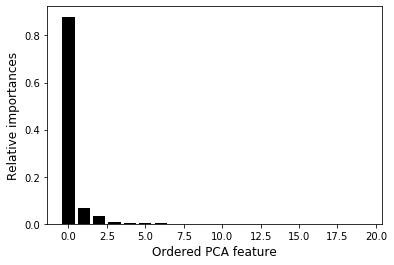

In [33]:
fig = plt.figure()
ax = fig.add_subplot()
ax.bar(x=np.arange(pca.explained_variance_ratio_.shape[0]), height=pca.explained_variance_ratio_, color='k')
ax.set_ylabel('Relative importances', fontsize=12)
ax.set_xlabel('Ordered PCA feature', fontsize=12)
plt.show()

### Clustering images 
- We see that the 128 output nodes for the CNN can be easily compressed by a small number of PCA _super_-features
- Taking the 20 PCA feature dimensions as the input parameter space for clustering

### First up trying K-means as a baseline

In [43]:
kmeans = KMeans(n_clusters=20, n_jobs=-1)
kmeans.fit(compressed_features)

# extracting cluster labels.
np.unique(kmeans.labels_, return_counts=True)

/opt/miniconda3/lib/python3.7/site-packages/sklearn/cluster/_kmeans.py:939: FutureWarning: 'n_jobs' was deprecated in version 0.23 and will be removed in 0.25.
  " removed in 0.25.", FutureWarning)


(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17, 18, 19], dtype=int32),
 array([238, 182, 626, 288, 341, 316, 557, 264, 194, 187, 483, 539, 432,
        279, 236, 293, 334, 168, 255, 225]))

Cluster : 0


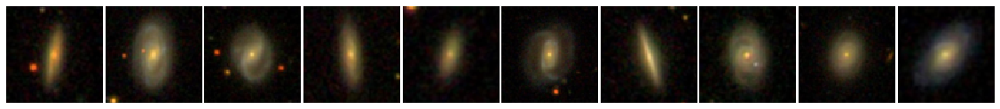

Cluster : 1


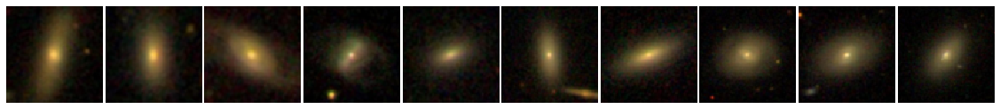

Cluster : 2


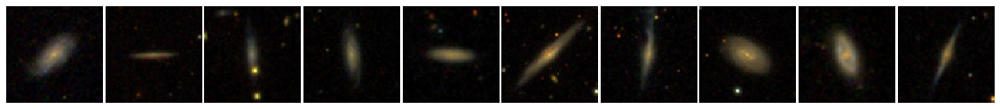

Cluster : 3


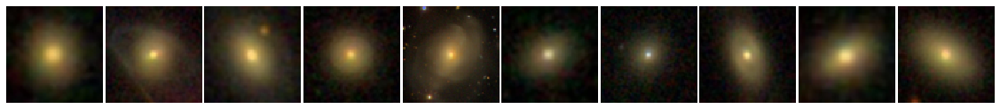

Cluster : 4


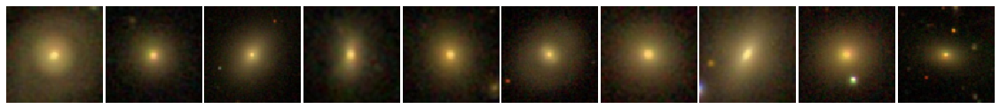

Cluster : 5


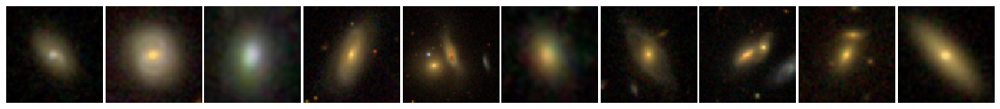

Cluster : 6


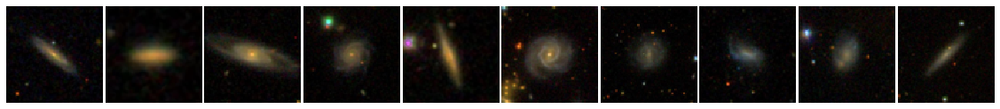

Cluster : 7


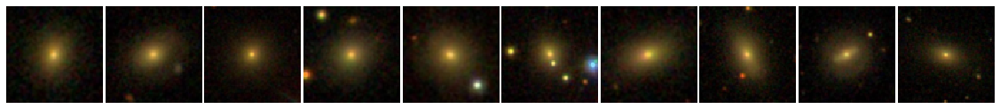

Cluster : 8


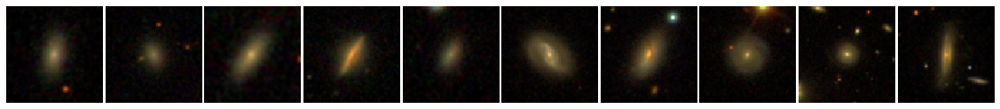

Cluster : 9


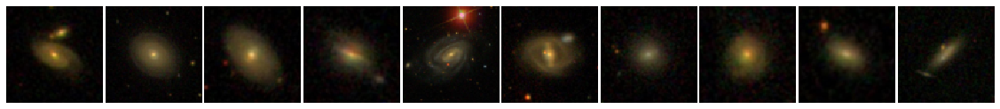

Cluster : 10


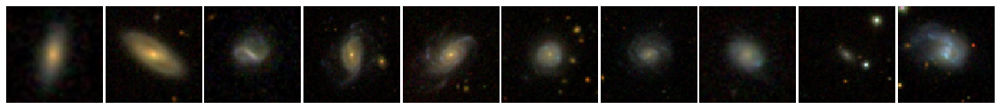

Cluster : 11


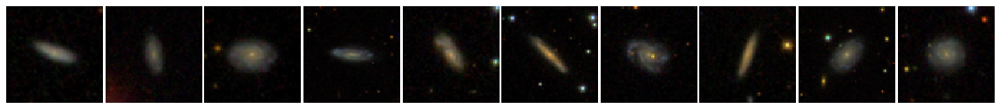

Cluster : 12


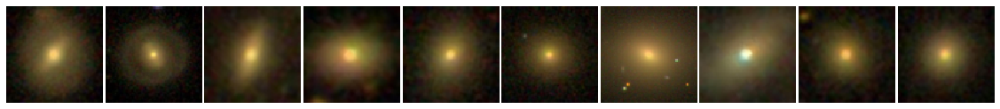

Cluster : 13


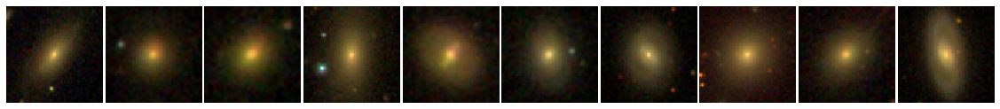

Cluster : 14


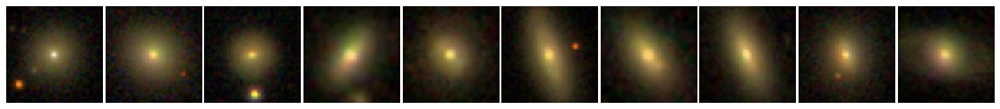

Cluster : 15


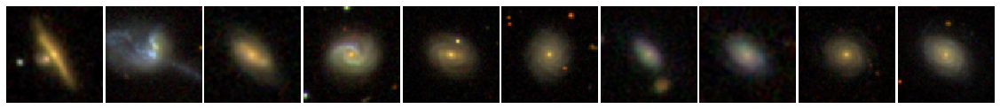

Cluster : 16


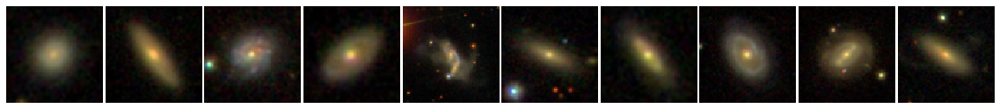

Cluster : 17


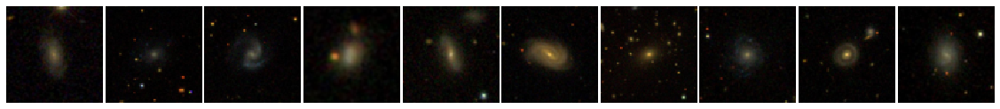

Cluster : 18


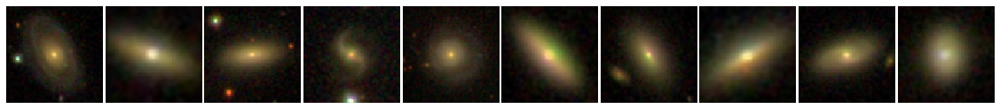

Cluster : 19


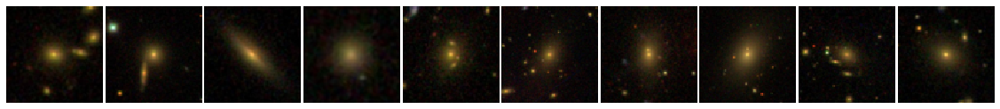

In [44]:
for cluster in np.unique(kmeans.labels_):
    print('Cluster : {}'.format(cluster))
    cluster_evaluate.plot_cluster(x[kmeans.labels_ == cluster][0:10])
    plt.show()

### Affinity propagation 
- Theres not really a _good_ answer for how many clusters of galaxies we should have, so now lets try an algorithm that dictates the number of clusters.
- Affinity propagation works by finding 'exemplars' (i.e. prime examples for a representative group) through sending 'messages' between each of the samples. Here you define groups (or their exemplars) to minimise a certain metric (e.g. average distance between samples in the parameter space or variance). 

In [47]:
aff_prop = AffinityPropagation(damping=0.9)
# fit the model
aff_prop.fit(compressed_features)
# assign a cluster to each example
aff_prop_labels = aff_prop.predict(compressed_features)

/opt/miniconda3/lib/python3.7/site-packages/sklearn/cluster/_affinity_propagation.py:152: FutureWarning: 'random_state' has been introduced in 0.23. It will be set to None starting from 0.25 which means that results will differ at every function call. Set 'random_state' to None to silence this warning, or to 0 to keep the behavior of versions <0.23.
  FutureWarning)


In [50]:
np.unique(aff_prop_labels, return_counts=True)

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33,
        34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50,
        51, 52, 53, 54]),
 array([225,  81,  73,  61,  57, 111,  86, 138,  96,  82,  66, 203, 110,
        102, 161,  80, 214, 108, 175, 144, 143, 202,  44,  69, 139,  69,
        100, 106,  60, 213, 124,  73, 108, 101,  99, 135, 188, 159,  86,
        110, 133, 207, 162, 130, 139,  93,  90, 118, 136, 106, 106,  92,
         64,  58, 102]))

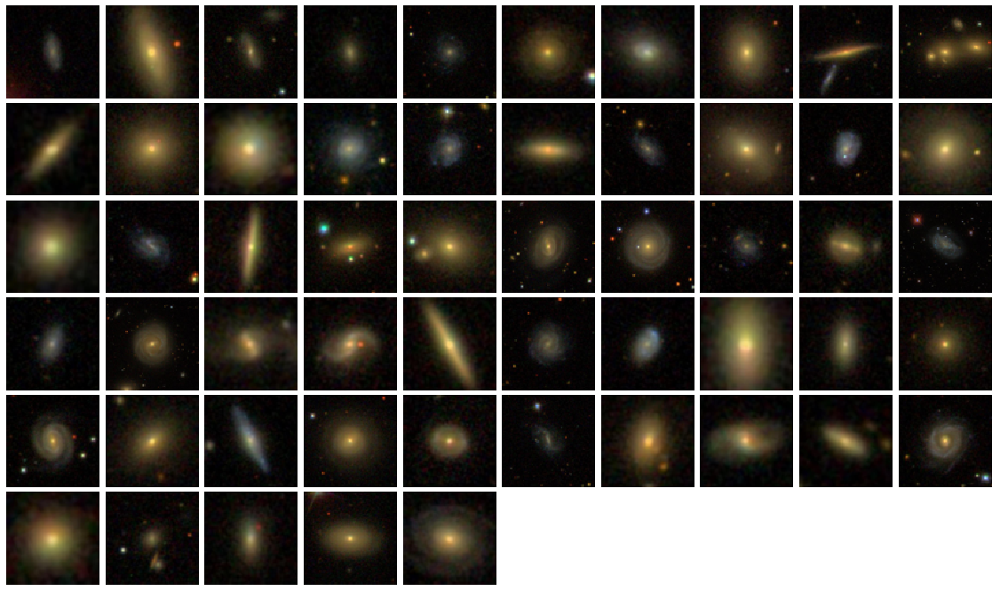

In [52]:
# Plotting exemplars for each of the clusters
cluster_evaluate.plot_cluster(x[aff_prop.cluster_centers_indices_]) ;

Cluster : 0


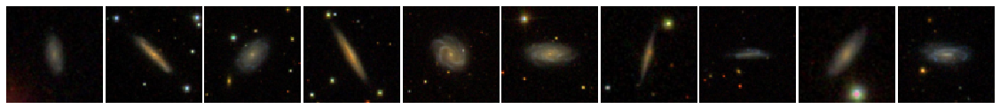

Cluster : 1


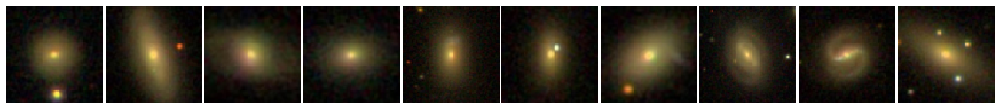

Cluster : 2


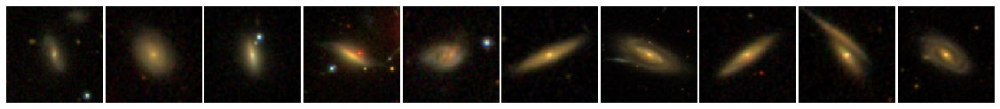

Cluster : 3


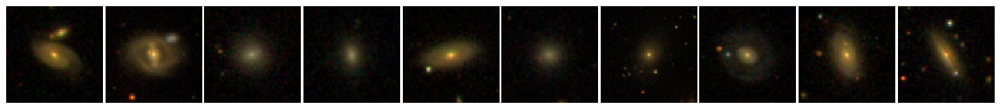

Cluster : 4


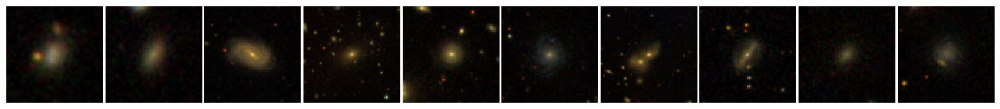

Cluster : 5


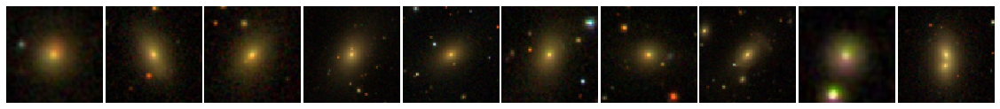

Cluster : 6


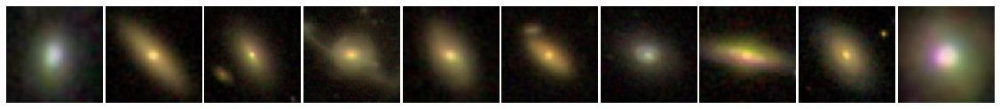

Cluster : 7


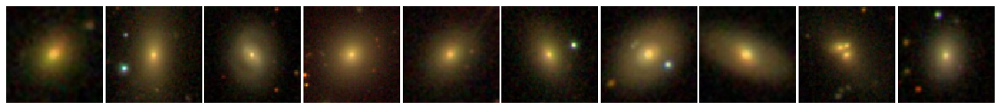

Cluster : 8


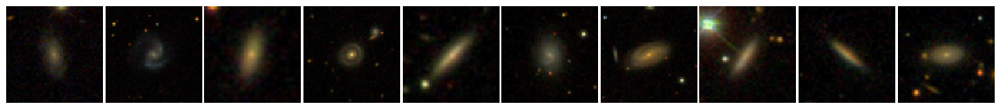

Cluster : 9


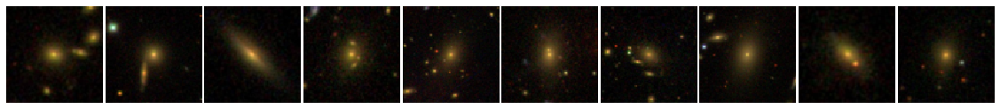

Cluster : 10


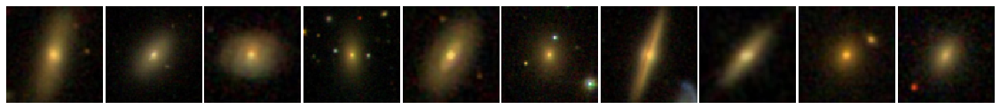

Cluster : 11


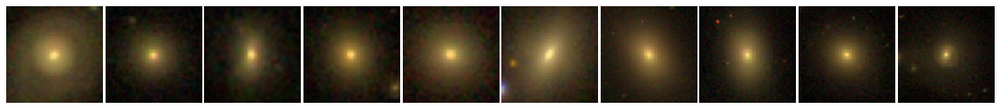

Cluster : 12


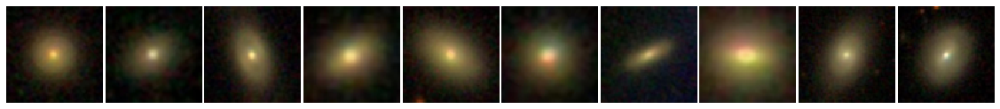

Cluster : 13


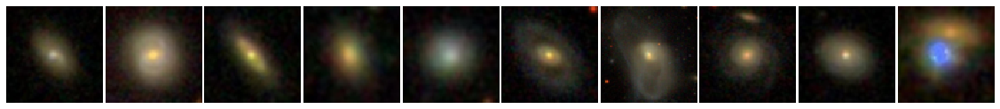

Cluster : 14


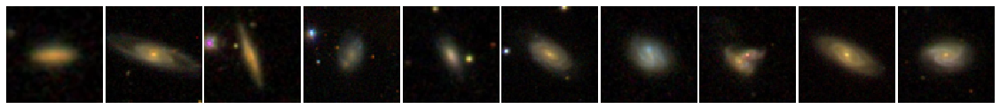

Cluster : 15


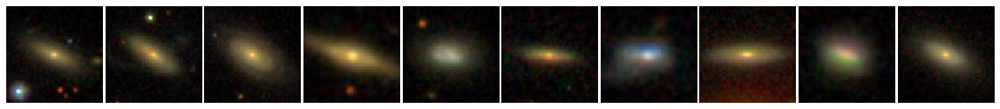

Cluster : 16


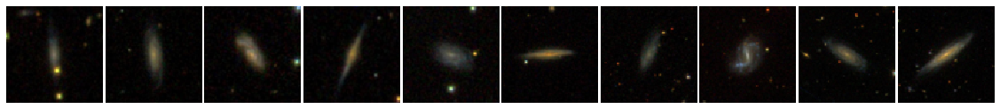

Cluster : 17


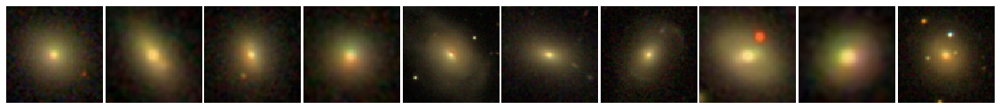

Cluster : 18


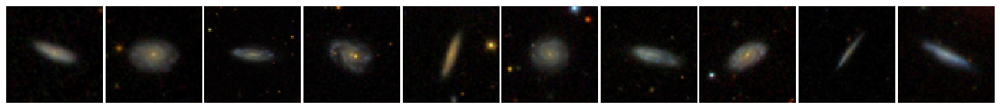

Cluster : 19


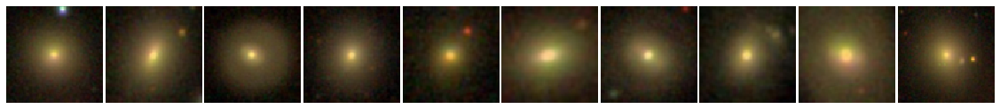

Cluster : 20


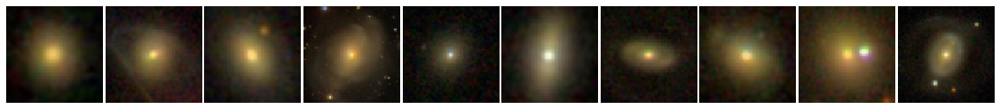

Cluster : 21


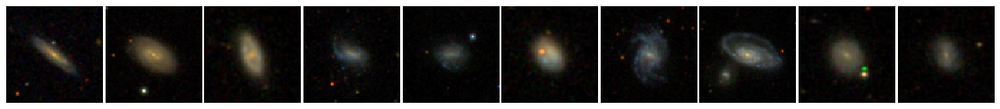

Cluster : 22


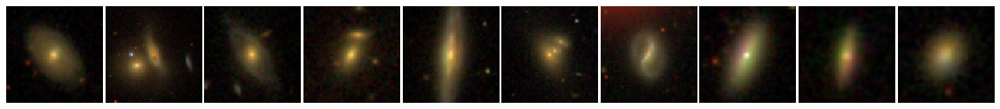

Cluster : 23


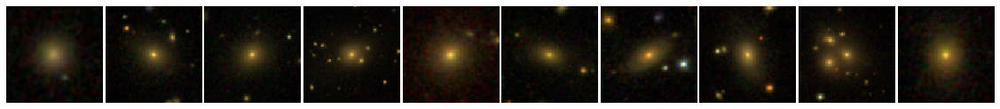

Cluster : 24


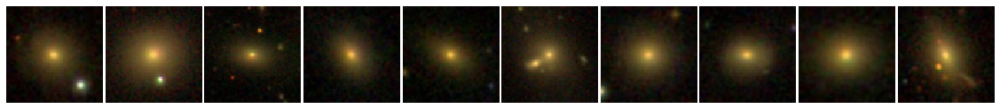

Cluster : 25


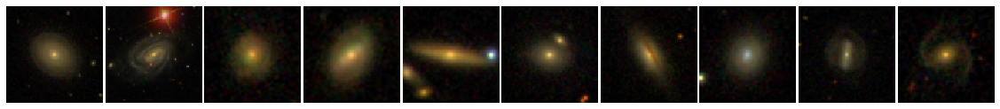

Cluster : 26


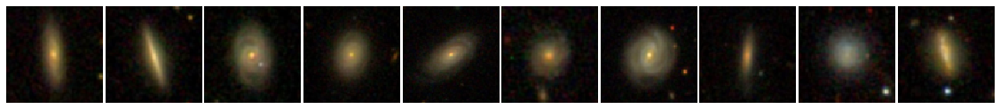

Cluster : 27


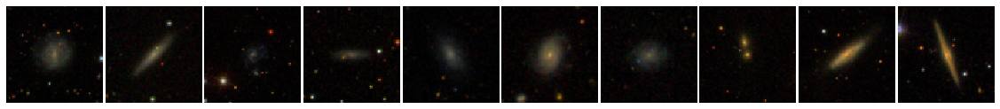

Cluster : 28


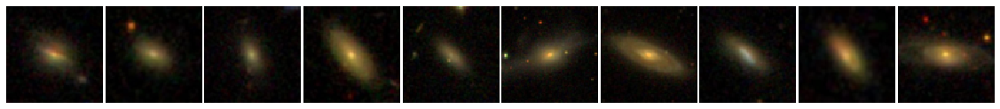

Cluster : 29


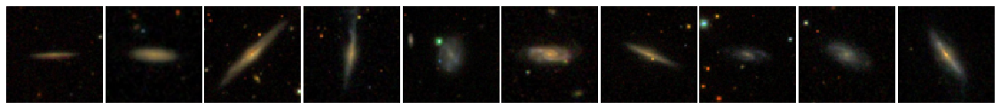

Cluster : 30


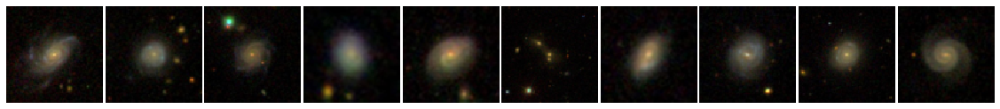

Cluster : 31


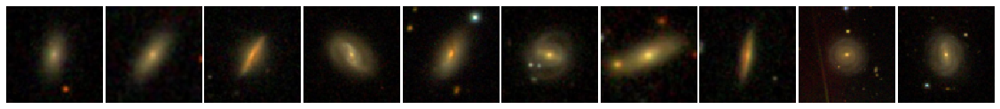

Cluster : 32


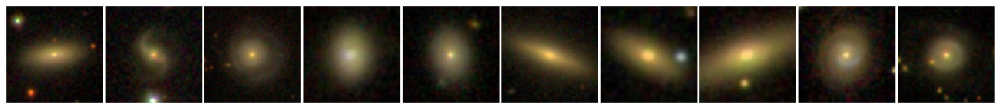

Cluster : 33


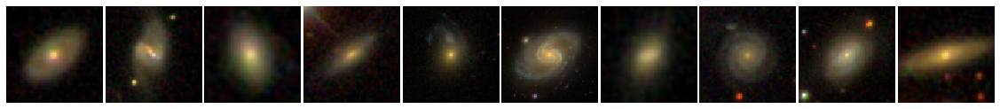

Cluster : 34


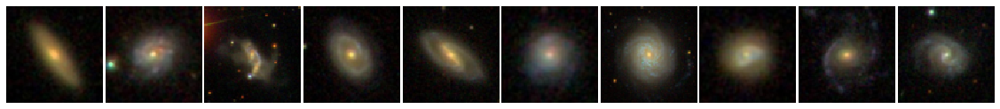

Cluster : 35


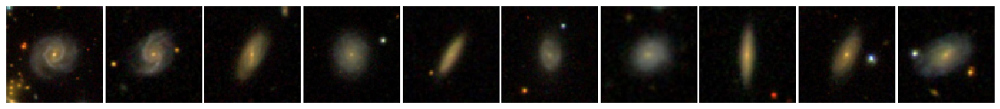

Cluster : 36


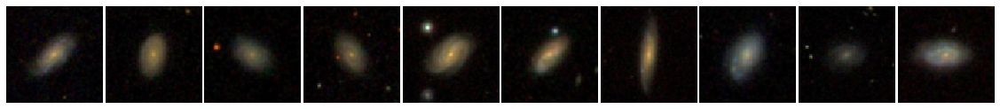

Cluster : 37


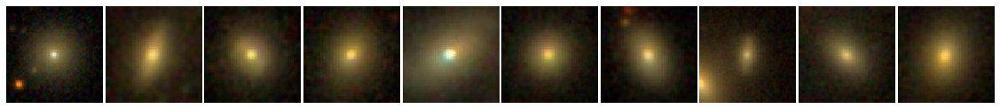

Cluster : 38


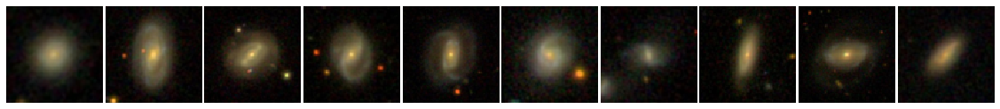

Cluster : 39


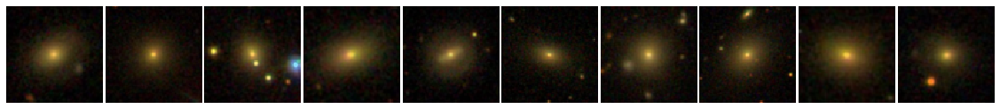

Cluster : 40


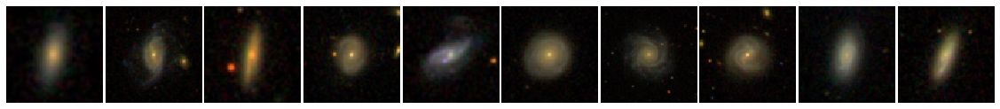

Cluster : 41


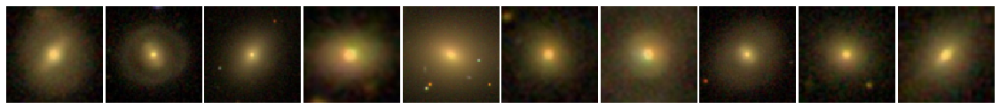

Cluster : 42


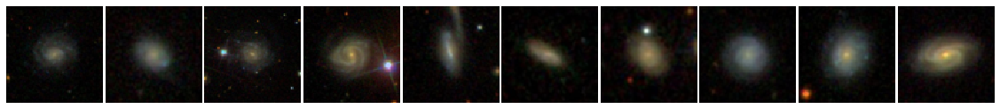

Cluster : 43


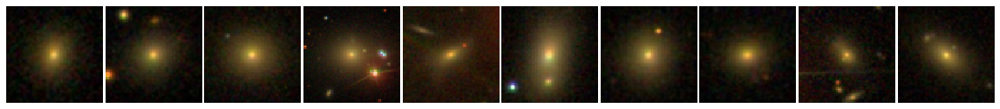

Cluster : 44


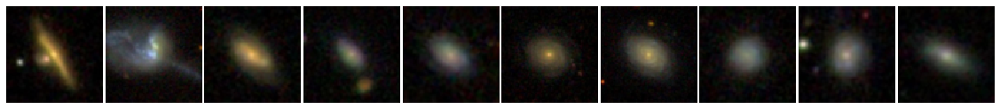

Cluster : 45


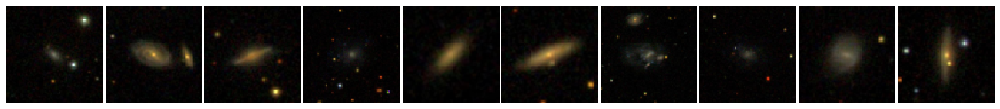

Cluster : 46


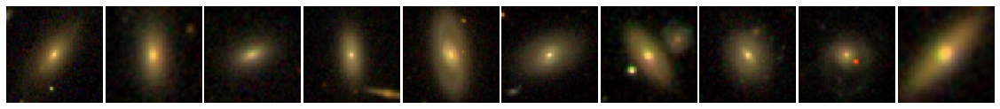

Cluster : 47


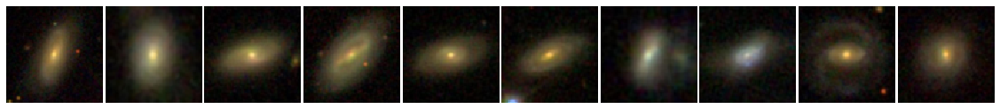

Cluster : 48


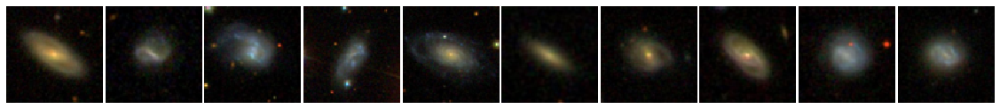

Cluster : 49


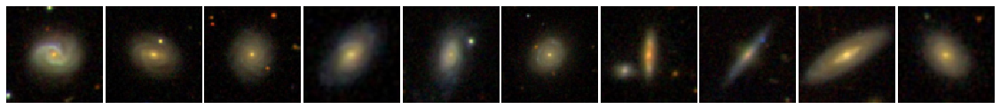

Cluster : 50


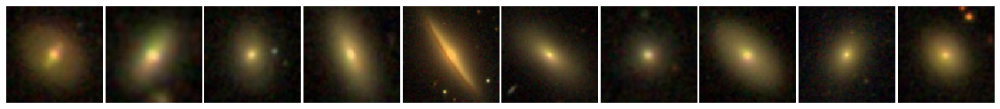

Cluster : 51


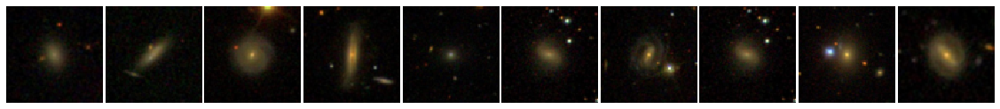

Cluster : 52


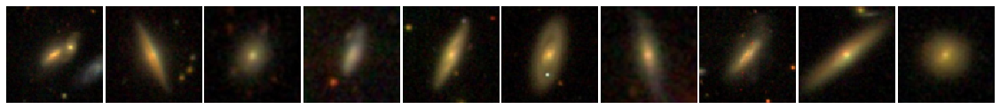

Cluster : 53


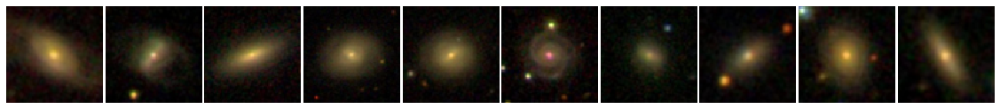

Cluster : 54


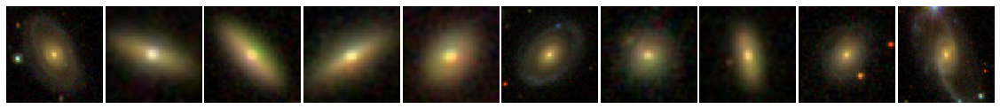

In [49]:
for cluster in np.unique(aff_prop_labels):
    print('Cluster : {}'.format(cluster))
    cluster_evaluate.plot_cluster(x[aff_prop_labels == cluster][0:10])
    plt.show()

### Hierarchical (agglomerative) clustering
- Affinity propagation appears to do quite a good job at grouping together individual clusters (and helps intuit the ballpark number of catagories), however, the clustering of galaxies is most likely hierarchical in structure (clustering-wise at least). 
- Using agglomerative clustering to construct clusters

In [56]:
# define the model
agglo = AgglomerativeClustering(n_clusters=10, linkage='ward')
# fit the model
agglo_labels = agglo.fit_predict(compressed_features)

Cluster : 0


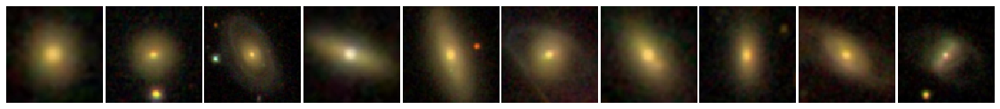

Cluster : 1


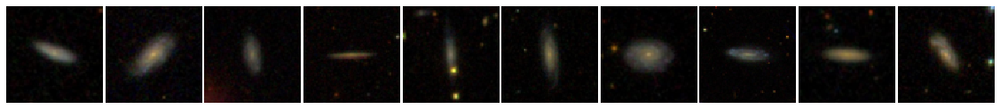

Cluster : 2


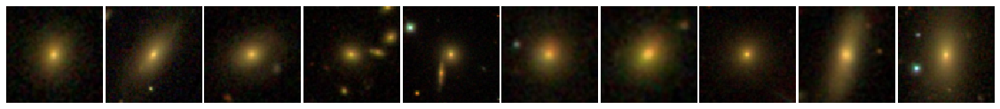

Cluster : 3


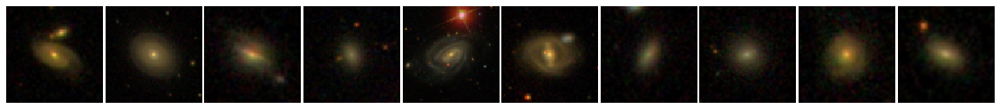

Cluster : 4


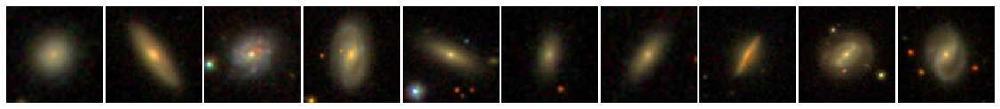

Cluster : 5


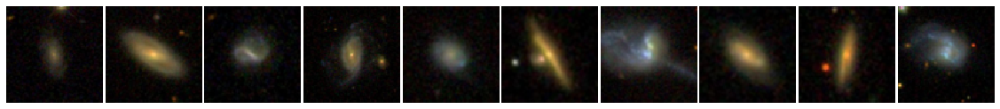

Cluster : 6


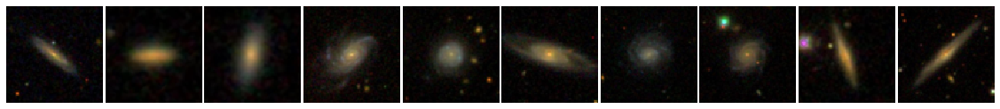

Cluster : 7


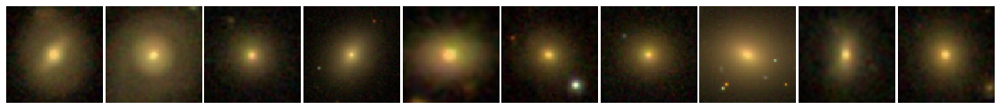

Cluster : 8


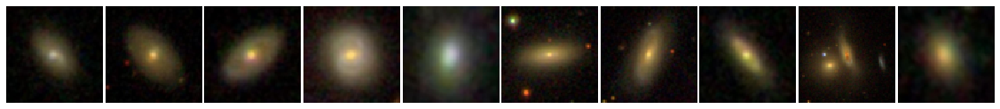

Cluster : 9


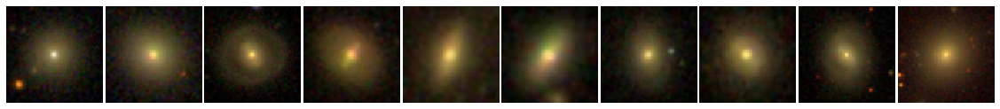

In [57]:
for cluster in np.unique(agglo_labels):
    print('Cluster : {}'.format(cluster))
    cluster_evaluate.plot_cluster(x[agglo_labels == cluster][0:10])
    plt.show()